In [125]:
import optuna
import numpy as np
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.ensemble import StackingClassifier
from collections import Counter
import pandas as pd

**Reading the pre-processed data files**

In [75]:

train_data = pd.read_parquet("train.parquet")
val_data = pd.read_parquet("val.parquet")
test_data = pd.read_parquet("test.parquet")

In [76]:

feature_cols = [col for col in train_data.columns if col != 'target']
target_col = 'target'

In [77]:

X_train, y_train = train_data[feature_cols], train_data[target_col]
X_val, y_val = val_data[feature_cols], val_data[target_col]
X_test, y_test = test_data[feature_cols], test_data[target_col]

**Define all the tunning functions for each of the 5 models**

In [78]:
from sklearn.model_selection import cross_val_score

def tune_rf(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5)
    }
    rf_model = RandomForestClassifier(**params, random_state=42)
    cv_scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='accuracy')
    return cv_scores.mean()




In [79]:
def tune_xgb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'lambda': trial.suggest_float('lambda', 1e-3, 10.0),
        'alpha': trial.suggest_float('alpha', 1e-3, 10.0)
    }
    
    xgb_model = xgb.XGBClassifier(**params, random_state=42, use_label_encoder=False, eval_metric='logloss')

    cv_scores = cross_val_score(xgb_model, X_train, y_train, cv=5, scoring='accuracy')
    
    return cv_scores.mean()



In [80]:

def tune_lgb(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 50),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0)
    }
    
    lgb_model = lgb.LGBMClassifier(**params, random_state=42)

    cv_scores = cross_val_score(lgb_model, X_train, y_train, cv=5, scoring='accuracy')
    
    return cv_scores.mean()



In [81]:
def tune_catboost(trial):
    params = {
        'iterations': trial.suggest_int('iterations', 50, 500),
        'depth': trial.suggest_int('depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-3, 10.0),
        'border_count': trial.suggest_int('border_count', 32, 255),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.5, 1.0),
        'random_strength': trial.suggest_float('random_strength', 1e-3, 10.0),
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 10.0),
        'verbose': 0 
    }
    
    cat_model = CatBoostClassifier(**params, random_state=42, task_type="CPU")
    cv_scores = cross_val_score(cat_model, X_train, y_train, cv=5, scoring='accuracy')
    
    return cv_scores.mean()


**Deal with unbalanced data using SMOTE**

In [ ]:
#Balance
smote = SMOTE(sampling_strategy='auto', random_state=0)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

**Running hyperparameter tunning over 30 iterations**

In [83]:
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(tune_rf, n_trials=30)
best_rf_params = study_rf.best_params

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(tune_xgb, n_trials=30)
best_xgb_params = study_xgb.best_params

study_lgb = optuna.create_study(direction='maximize')
study_lgb.optimize(tune_lgb, n_trials=30)
best_lgb_params = study_lgb.best_params

study_catboost = optuna.create_study(direction='maximize')
study_catboost.optimize(tune_catboost, n_trials=30)
best_catboost_params = study_catboost.best_params


[I 2025-03-02 02:43:39,287] A new study created in memory with name: no-name-322e1b09-71b5-42de-9463-324f33e068e3
[I 2025-03-02 02:43:39,869] Trial 0 finished with value: 0.8635192609023015 and parameters: {'n_estimators': 85, 'max_depth': 17, 'min_samples_split': 2, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.8635192609023015.
[I 2025-03-02 02:43:41,845] Trial 1 finished with value: 0.8711829226104475 and parameters: {'n_estimators': 283, 'max_depth': 18, 'min_samples_split': 7, 'min_samples_leaf': 3}. Best is trial 1 with value: 0.8711829226104475.
[I 2025-03-02 02:43:42,238] Trial 2 finished with value: 0.8705398750534178 and parameters: {'n_estimators': 54, 'max_depth': 18, 'min_samples_split': 9, 'min_samples_leaf': 1}. Best is trial 1 with value: 0.8711829226104475.
[I 2025-03-02 02:43:43,395] Trial 3 finished with value: 0.8545939236075781 and parameters: {'n_estimators': 276, 'max_depth': 3, 'min_samples_split': 3, 'min_samples_leaf': 2}. Best is trial 1 with value: 0

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1702
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:45:26,415] Trial 0 finished with value: 0.8692619197818523 and parameters: {'n_estimators': 181, 'max_depth': 16, 'learning_rate': 0.199741717008908, 'num_leaves': 108, 'min_child_samples': 48, 'subsample': 0.5341904166979128, 'colsample_bytree': 0.5304584483147089, 'reg_alpha': 8.800896161058109, 'reg_lambda': 5.973400720716262}. Best is trial 0 with value: 0.8692619197818523.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGB

[I 2025-03-02 02:45:27,727] Trial 1 finished with value: 0.8762825339329684 and parameters: {'n_estimators': 124, 'max_depth': 13, 'learning_rate': 0.12739684879959615, 'num_leaves': 119, 'min_child_samples': 37, 'subsample': 0.7078675119007539, 'colsample_bytree': 0.6975799069576535, 'reg_alpha': 2.685794314881783, 'reg_lambda': 0.10449417832236256}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:45:28,476] Trial 2 finished with value: 0.867353126716998 and parameters: {'n_estimators': 214, 'max_depth': 18, 'learning_rate': 0.20064375917332816, 'num_leaves': 111, 'min_child_samples': 11, 'subsample': 0.7295698367739718, 'colsample_bytree': 0.8880953937073142, 'reg_alpha': 8.569672238008364, 'reg_lambda': 8.53196075688511}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-03-02 02:45:29,410] Trial 3 finished with value: 0.869900897417635 and parameters: {'n_estimators': 216, 'max_depth': 16, 'learning_rate': 0.142893162259372, 'num_leaves': 39, 'min_child_samples': 33, 'subsample': 0.643284725742222, 'colsample_bytree': 0.5170686665930295, 'reg_alpha': 5.870045716273901, 'reg_lambda': 0.921658774267469}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:45:30,047] Trial 4 finished with value: 0.8711768177285769 and parameters: {'n_estimators': 136, 'max_depth': 5, 'learning_rate': 0.17723694848891786, 'num_leaves': 21, 'min_child_samples': 40, 'subsample': 0.6017690919350421, 'colsample_bytree': 0.581990613490929, 'reg_alpha': 5.462773785409474, 'reg_lambda': 0.13211170418968698}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1702
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:45:30,785] Trial 5 finished with value: 0.8705419100140412 and parameters: {'n_estimators': 275, 'max_depth': 17, 'learning_rate': 0.2558339365910625, 'num_leaves': 97, 'min_child_samples': 37, 'subsample': 0.7330988963502005, 'colsample_bytree': 0.733169164153835, 'reg_alpha': 6.77227945687464, 'reg_lambda': 3.721367610523831}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:45:34,486] Trial 6 finished with value: 0.87500864858265 and parameters: {'n_estimators': 158, 'max_depth': 12, 'learning_rate': 0.08693211945090583, 'num_leaves': 60, 'min_child_samples': 16, 'subsample': 0.6186863328028677, 'colsample_bytree': 0.7372949041651895, 'reg_alpha': 0.2057520777611263, 'reg_lambda': 4.2750263859284505}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:45:35,184] Trial 7 finished with value: 0.8641623084593313 and parameters: {'n_estimators': 207, 'max_depth': 6, 'learning_rate': 0.16768733428556856, 'num_leaves': 105, 'min_child_samples': 6, 'subsample': 0.615705779727747, 'colsample_bytree': 0.5584309139863328, 'reg_alpha': 9.22957883663099, 'reg_lambda': 3.3248171852551645}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1702
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:45:36,330] Trial 8 finished with value: 0.8660772064060561 and parameters: {'n_estimators': 450, 'max_depth': 9, 'learning_rate': 0.1354552235128201, 'num_leaves': 68, 'min_child_samples': 49, 'subsample': 0.9105581222809076, 'colsample_bytree': 0.9261872101736163, 'reg_alpha': 7.510584034800535, 'reg_lambda': 7.953484770856829}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:45:37,409] Trial 9 finished with value: 0.8698988624570114 and parameters: {'n_estimators': 331, 'max_depth': 19, 'learning_rate': 0.1529784793535281, 'num_leaves': 82, 'min_child_samples': 18, 'subsample': 0.6268688959818807, 'colsample_bytree': 0.6228656035379212, 'reg_alpha': 5.838404944997309, 'reg_lambda': 0.6402087181600377}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1705
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:45:38,271] Trial 10 finished with value: 0.8539549459717953 and parameters: {'n_estimators': 57, 'max_depth': 12, 'learning_rate': 0.012580135953142196, 'num_leaves': 150, 'min_child_samples': 26, 'subsample': 0.9088058089556228, 'colsample_bytree': 0.8346964389771449, 'reg_alpha': 2.3713582944020835, 'reg_lambda': 2.413425500330855}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1705
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:45:39,409] Trial 11 finished with value: 0.8711747827679535 and parameters: {'n_estimators': 59, 'max_depth': 11, 'learning_rate': 0.06845125969289458, 'num_leaves': 139, 'min_child_samples': 21, 'subsample': 0.8074021579942525, 'colsample_bytree': 0.715013822933085, 'reg_alpha': 0.45619639147281177, 'reg_lambda': 5.542783129802695}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:45:40,970] Trial 12 finished with value: 0.8718137604037361 and parameters: {'n_estimators': 122, 'max_depth': 13, 'learning_rate': 0.08569755964275627, 'num_leaves': 57, 'min_child_samples': 29, 'subsample': 0.813363123059375, 'colsample_bytree': 0.6734864420420124, 'reg_alpha': 3.308843674832385, 'reg_lambda': 6.72889454974516}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:45:47,493] Trial 13 finished with value: 0.8750086485826498 and parameters: {'n_estimators': 301, 'max_depth': 9, 'learning_rate': 0.09746835404605746, 'num_leaves': 129, 'min_child_samples': 17, 'subsample': 0.5034860238688008, 'colsample_bytree': 0.7959676404254201, 'reg_alpha': 0.006264276835126259, 'reg_lambda': 9.7824342539776}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1702
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:45:49,210] Trial 14 finished with value: 0.8724486681182719 and parameters: {'n_estimators': 134, 'max_depth': 14, 'learning_rate': 0.03779815438425168, 'num_leaves': 77, 'min_child_samples': 42, 'subsample': 0.6938434758761848, 'colsample_bytree': 0.99382794958673, 'reg_alpha': 2.3897327213269772, 'reg_lambda': 2.13079893466381}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Foun

[I 2025-03-02 02:45:51,221] Trial 15 finished with value: 0.8698907226145174 and parameters: {'n_estimators': 462, 'max_depth': 9, 'learning_rate': 0.11535556313697463, 'num_leaves': 52, 'min_child_samples': 27, 'subsample': 0.8182219427759366, 'colsample_bytree': 0.6534047975831682, 'reg_alpha': 3.828664698465594, 'reg_lambda': 4.418544614168808}. Best is trial 1 with value: 0.8762825339329684.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1705
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:45:53,530] Trial 16 finished with value: 0.8769154066868806 and parameters: {'n_estimators': 393, 'max_depth': 3, 'learning_rate': 0.05508208663307752, 'num_leaves': 125, 'min_child_samples': 13, 'subsample': 0.5701278448136526, 'colsample_bytree': 0.787220534319036, 'reg_alpha': 1.4077198333904137, 'reg_lambda': 1.9699713368531322}. Best is trial 16 with value: 0.8769154066868806.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1708
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:45:57,240] Trial 17 finished with value: 0.877560489204534 and parameters: {'n_estimators': 383, 'max_depth': 4, 'learning_rate': 0.045177765128046284, 'num_leaves': 124, 'min_child_samples': 6, 'subsample': 0.9814607241107514, 'colsample_bytree': 0.803668140041749, 'reg_alpha': 1.6573318987954166, 'reg_lambda': 1.7742119563333192}. Best is trial 17 with value: 0.877560489204534.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1708
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:45:59,461] Trial 18 finished with value: 0.8724466331576484 and parameters: {'n_estimators': 383, 'max_depth': 3, 'learning_rate': 0.043310722411352864, 'num_leaves': 126, 'min_child_samples': 7, 'subsample': 0.9917307107542295, 'colsample_bytree': 0.8194083883746537, 'reg_alpha': 1.3820107093875533, 'reg_lambda': 1.9929146525450796}. Best is trial 17 with value: 0.877560489204534.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:46:01,790] Trial 19 finished with value: 0.867344986874504 and parameters: {'n_estimators': 400, 'max_depth': 3, 'learning_rate': 0.01225028782390019, 'num_leaves': 91, 'min_child_samples': 11, 'subsample': 0.9383534855477191, 'colsample_bytree': 0.777220446031108, 'reg_alpha': 3.7987465852753655, 'reg_lambda': 1.603521175129583}. Best is trial 17 with value: 0.877560489204534.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000643 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1705
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:46:07,992] Trial 20 finished with value: 0.8750025437007795 and parameters: {'n_estimators': 362, 'max_depth': 6, 'learning_rate': 0.0526924707334358, 'num_leaves': 147, 'min_child_samples': 12, 'subsample': 0.5585276725616444, 'colsample_bytree': 0.8760095661305081, 'reg_alpha': 1.2824768164012998, 'reg_lambda': 2.99717846035607}. Best is trial 17 with value: 0.877560489204534.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1705
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:46:10,366] Trial 21 finished with value: 0.8788343745548524 and parameters: {'n_estimators': 492, 'max_depth': 5, 'learning_rate': 0.11071934905388818, 'num_leaves': 121, 'min_child_samples': 23, 'subsample': 0.6930191612527066, 'colsample_bytree': 0.6968723835893279, 'reg_alpha': 1.9710449574241533, 'reg_lambda': 0.9939819311016924}. Best is trial 21 with value: 0.8788343745548524.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-03-02 02:46:13,950] Trial 22 finished with value: 0.8762866038542153 and parameters: {'n_estimators': 497, 'max_depth': 4, 'learning_rate': 0.06691868228493496, 'num_leaves': 133, 'min_child_samples': 23, 'subsample': 0.6684105531897542, 'colsample_bytree': 0.7590447064587982, 'reg_alpha': 1.356832847903593, 'reg_lambda': 1.4109901757213783}. Best is trial 21 with value: 0.8788343745548524.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1708
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:46:15,056] Trial 23 finished with value: 0.8730917156753015 and parameters: {'n_estimators': 428, 'max_depth': 7, 'learning_rate': 0.294545435191115, 'num_leaves': 119, 'min_child_samples': 5, 'subsample': 0.7759336823302774, 'colsample_bytree': 0.8496730945702389, 'reg_alpha': 4.537138362988513, 'reg_lambda': 2.6778008144973375}. Best is trial 21 with value: 0.8788343745548524.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-03-02 02:46:18,124] Trial 24 finished with value: 0.8762906737754624 and parameters: {'n_estimators': 489, 'max_depth': 7, 'learning_rate': 0.11198025804016976, 'num_leaves': 99, 'min_child_samples': 11, 'subsample': 0.8622958109413934, 'colsample_bytree': 0.6277854052114551, 'reg_alpha': 1.761996216289873, 'reg_lambda': 1.1385843318167166}. Best is trial 21 with value: 0.8788343745548524.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-03-02 02:46:21,832] Trial 25 finished with value: 0.875000508740156 and parameters: {'n_estimators': 417, 'max_depth': 4, 'learning_rate': 0.02458793127568375, 'num_leaves': 118, 'min_child_samples': 14, 'subsample': 0.5674483038830858, 'colsample_bytree': 0.7963163131596952, 'reg_alpha': 3.0347975017720596, 'reg_lambda': 3.525592872634679}. Best is trial 21 with value: 0.8788343745548524.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000700 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1705
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:46:25,850] Trial 26 finished with value: 0.8756496611790563 and parameters: {'n_estimators': 349, 'max_depth': 5, 'learning_rate': 0.05308068683179981, 'num_leaves': 139, 'min_child_samples': 22, 'subsample': 0.7671539739138349, 'colsample_bytree': 0.9302055683783416, 'reg_alpha': 0.8838416405793976, 'reg_lambda': 1.6727801986322959}. Best is trial 21 with value: 0.8788343745548524.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:46:27,784] Trial 27 finished with value: 0.8762825339329684 and parameters: {'n_estimators': 321, 'max_depth': 3, 'learning_rate': 0.07405194728121392, 'num_leaves': 137, 'min_child_samples': 8, 'subsample': 0.9992527041798946, 'colsample_bytree': 0.6950373054335555, 'reg_alpha': 1.9994533443307878, 'reg_lambda': 0.7706447415079669}. Best is trial 21 with value: 0.8788343745548524.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-02 02:46:29,680] Trial 28 finished with value: 0.8692700596243462 and parameters: {'n_estimators': 445, 'max_depth': 8, 'learning_rate': 0.1047330555442137, 'num_leaves': 124, 'min_child_samples': 20, 'subsample': 0.5771741157435676, 'colsample_bytree': 0.7734788385535998, 'reg_alpha': 4.538704726689034, 'reg_lambda': 4.460554739746887}. Best is trial 21 with value: 0.8788343745548524.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 183, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1705
[LightGBM] [Info] Number of data points in the train set: 1254, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.145933 -> initscore=-1.766862
[LightGBM] [Info] Start training from score -1.766862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2025-03-02 02:46:32,602] Trial 29 finished with value: 0.8724568079607661 and parameters: {'n_estimators': 384, 'max_depth': 5, 'learning_rate': 0.193115337479363, 'num_leaves': 105, 'min_child_samples': 14, 'subsample': 0.5207522089398032, 'colsample_bytree': 0.814846541427914, 'reg_alpha': 0.8419236041848148, 'reg_lambda': 5.455747067851037}. Best is trial 21 with value: 0.8788343745548524.
[I 2025-03-02 02:46:32,604] A new study created in memory with name: no-name-d0fa0317-bec4-4161-8bc6-85fc2efa246c
[I 2025-03-02 02:46:35,010] Trial 0 finished with value: 0.872460877882013 and parameters: {'iterations': 221, 'depth': 7, 'learning_rate': 0.142585431983153, 'l2_leaf_reg': 6.227152780974381, 'border_count': 67, 'subsample': 0.6432957311557435, 'colsample_bylevel': 0.621047672851601, 'random_strength': 7.309306307183247, 'bagging_temperature': 6.372104952868862}. Best is trial 0 with value: 0.872460877882013.
[I 2025-03-02 02:46:36,251] Trial 1 finished with value: 0.87117681772857

**Training and fiting the best models**

In [84]:
# Train final models with best parameters
rf_model = RandomForestClassifier(**best_rf_params, random_state=42)
xgb_model = xgb.XGBClassifier(**best_xgb_params, random_state=42, use_label_encoder=False, eval_metric='logloss')
lgb_model = lgb.LGBMClassifier(**best_lgb_params, random_state=42)
catboost_model = CatBoostClassifier(**best_catboost_params, random_state=42, verbose=0)

# Fit models
rf_model.fit(X_train_resampled, y_train_resampled)
xgb_model.fit(X_train_resampled, y_train_resampled)
lgb_model.fit(X_train_resampled, y_train_resampled)
catboost_model.fit(X_train_resampled, y_train_resampled)

[02:51:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1339, number of negative: 1339
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4402
[LightGBM] [Info] Number of data points in the train set: 2678, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

**Build stacking model**

In [ ]:
# Define base models for stacking
base_models = [
    ('rf', rf_model),
    ('xgb', xgb_model),
    ('lgb', lgb_model),
    ('catboost', catboost_model)
]

meta_model = LogisticRegression()

stacking_model = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=5)

stacking_model.fit(X_train_resampled, y_train_resampled)

y_pred = stacking_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred)
print("Stacking Model Accuracy on Test Data:", test_accuracy)


[02:51:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1339, number of negative: 1339
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4402
[LightGBM] [Info] Number of data points in the train set: 2678, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[02:51:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[02:51:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[02:51:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[02:51:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[02:51:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "u

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1071, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4385
[LightGBM] [Info] Number of data points in the train set: 2142, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

**Plotting the ROC and precision-recall curve for all models and stacking**

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score

# Define a function to plot ROC and Precision-Recall curves
def plot_curves(models, X_test, y_test):
    plt.figure(figsize=(12, 5))

    #ROC Curve
    plt.subplot(1, 2, 1)
    for name, model in models.items():
        y_probs = model.predict_proba(X_test)[:, 1]  # Get probability scores for the positive class
        fpr, tpr, _ = roc_curve(y_test, y_probs)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")
    
    plt.plot([0, 1], [0, 1], 'k--')  # Random classifier line
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend()

    #Precision-Recall Curve
    plt.subplot(1, 2, 2)
    for name, model in models.items():
        y_probs = model.predict_proba(X_test)[:, 1]
        precision, recall, _ = precision_recall_curve(y_test, y_probs)
        pr_auc = average_precision_score(y_test, y_probs)
        plt.plot(recall, precision, label=f"{name} (AP = {pr_auc:.2f})")
    
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    plt.legend()

    plt.tight_layout()
    plt.show()


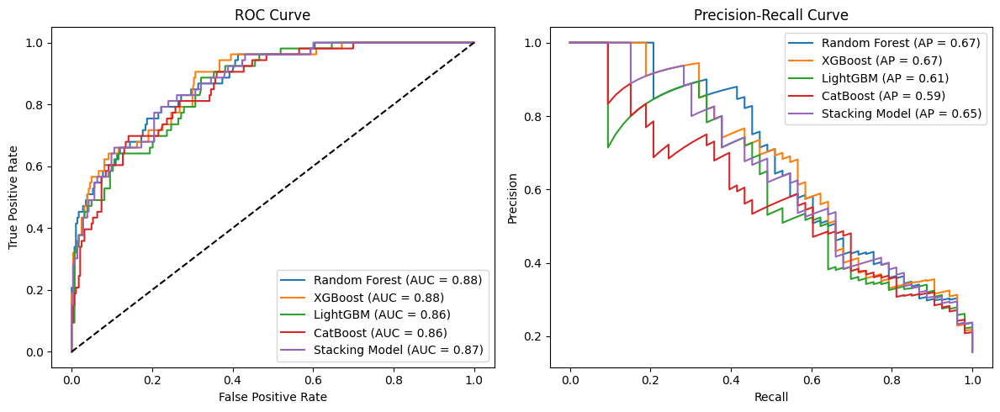

In [90]:
# Store all trained models in a dictionary
models = {
    "Random Forest": rf_model,
    "XGBoost": xgb_model,
    "LightGBM": lgb_model,
    "CatBoost": catboost_model,
    "Stacking Model": stacking_model
}

# Plot ROC and Precision-Recall Curves
plot_curves(models, X_test, y_test)


**Storing the models in plk files**

In [ ]:
import pickle
import os
model_dir = "models"

# Create the directory if it doesn't exist
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
models = {
    "RandomForest": rf_model,
    "XGBoost": xgb_model,
    "LightGBM": lgb_model,
    "CatBoost": catboost_model,
    "StackingModel": stacking_model
}

for model_name, model in models.items():
    filename = os.path.join(model_dir, f"{model_name}.pkl")
    with open(filename, 'wb') as file:
        pickle.dump(model, file)




**PLotting Validation and Training curves**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve, validation_curve

# Function to plot Validation Curve
def plot_validation_curve(model, X_train, y_train, model_name, param_name="n_estimators"):
    param_range = np.arange(50, 500, 50)  # Range of n_estimators

    # Special case for CatBoost (uses "iterations" instead of "n_estimators")
    if model_name == "CatBoost":
        param_name = "iterations"

    train_scores, val_scores = validation_curve(
        model, X_train, y_train, param_name=param_name, param_range=param_range,
        cv=5, scoring="accuracy", n_jobs=1  # Use n_jobs=1 to avoid multiprocessing issues
    )

    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)

    plt.figure(figsize=(8, 5))
    plt.plot(param_range, train_mean, label="Training Score", marker='o')
    plt.fill_between(param_range, train_mean - train_std, train_mean + train_std, alpha=0.2)
    plt.plot(param_range, val_mean, label="Validation Score", marker='s')
    plt.fill_between(param_range, val_mean - val_std, val_mean + val_std, alpha=0.2)

    plt.xlabel(param_name)
    plt.ylabel("Accuracy")
    plt.title(f"Validation Curve - {model_name}")
    plt.legend()
    plt.show()


from sklearn.model_selection import StratifiedKFold

def plot_learning_curve(model, X_train, y_train, model_name):
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)  # Ensure class balance in each fold

    train_sizes, train_scores, val_scores = learning_curve(
        model, X_train, y_train, cv=cv, scoring="accuracy", n_jobs=1,
        train_sizes=np.linspace(0.1, 1.0, 10), error_score='raise'
    )

    train_mean = np.nanmean(train_scores, axis=1)
    train_std = np.nanstd(train_scores, axis=1)
    val_mean = np.nanmean(val_scores, axis=1)
    val_std = np.nanstd(val_scores, axis=1)

    plt.figure(figsize=(8, 5))
    plt.plot(train_sizes, train_mean, label="Training Score", marker='o')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2)
    plt.plot(train_sizes, val_mean, label="Validation Score", marker='s')
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.2)

    plt.xlabel("Training Size")
    plt.ylabel("Accuracy")
    plt.title(f"Learning Curve - {model_name}")
    plt.legend()
    plt.show()





Plotting Learning Curve for Random Forest


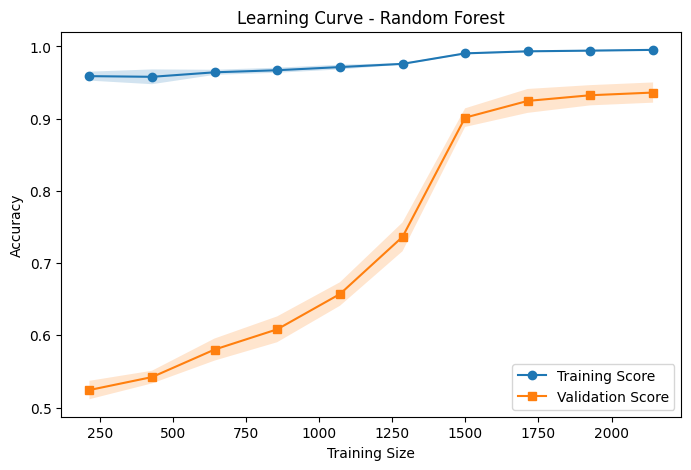


Plotting Learning Curve for XGBoost


[12:07:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[12:07:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[12:07:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[12:07:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[12:07:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "u

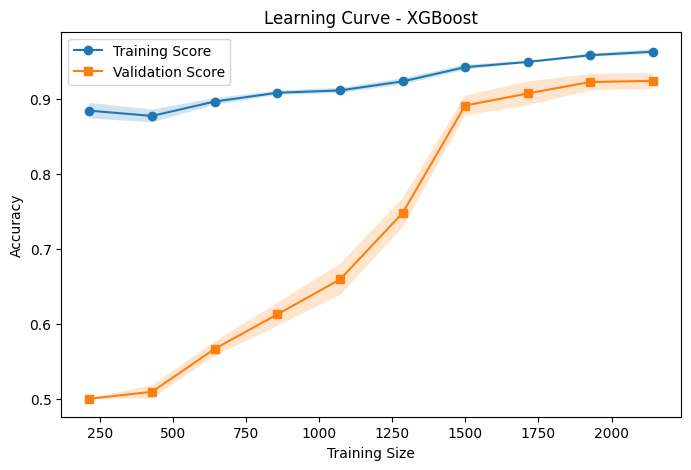


Plotting Learning Curve for LightGBM
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 27, number of negative: 187
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 214, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.126168 -> initscore=-1.935272
[LightGBM] [Info] Start training from score -1.935272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

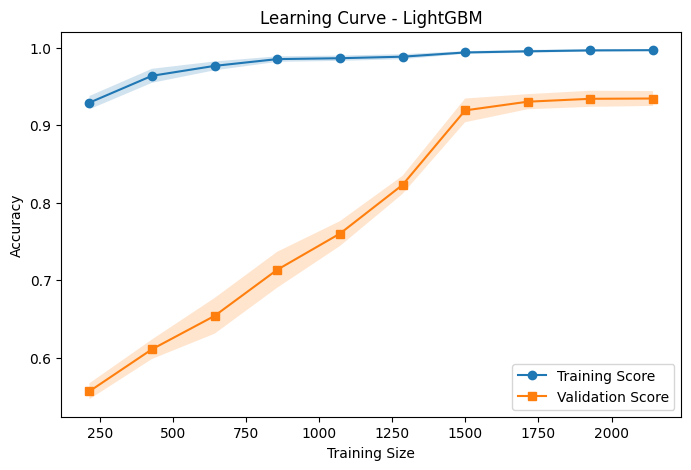


Plotting Learning Curve for CatBoost


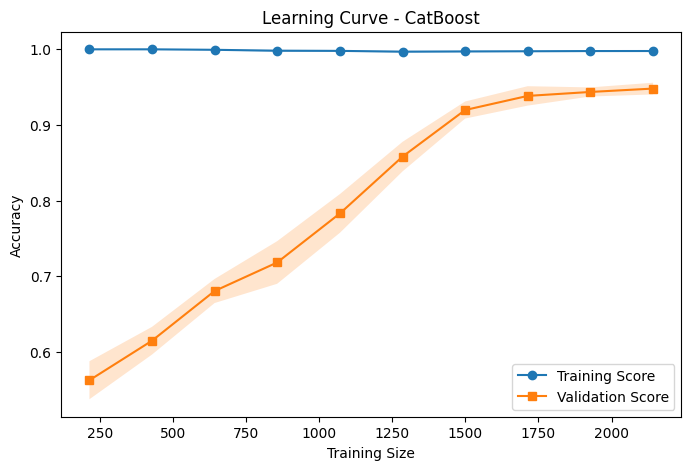

Skipping Learning Curves for Stacking Model (Not applicable)


In [ ]:
for model_name, model in models.items():
    if model_name == "Stacking Model":
        print(f"Skipping Learning Curves for {model_name} (Not applicable)")
        continue 
    print(f"\nPlotting Learning Curve for {model_name}")
    plot_learning_curve(model, X_train_resampled, y_train_resampled, model_name)




Plotting Validation Curve for Random Forest


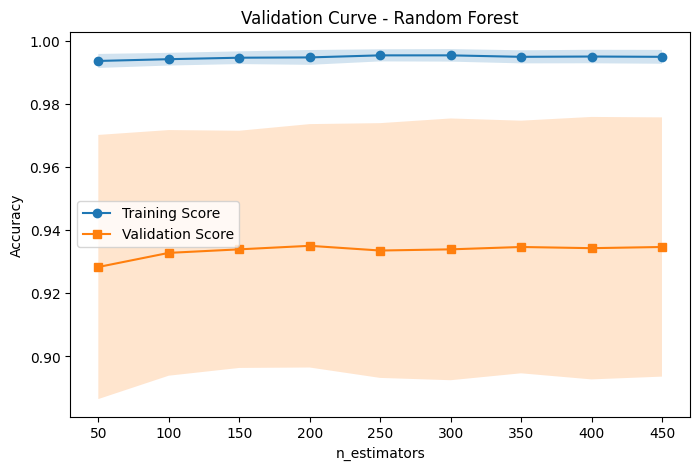


Plotting Validation Curve for XGBoost


[12:12:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[12:12:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[12:12:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[12:12:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

[12:12:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "u

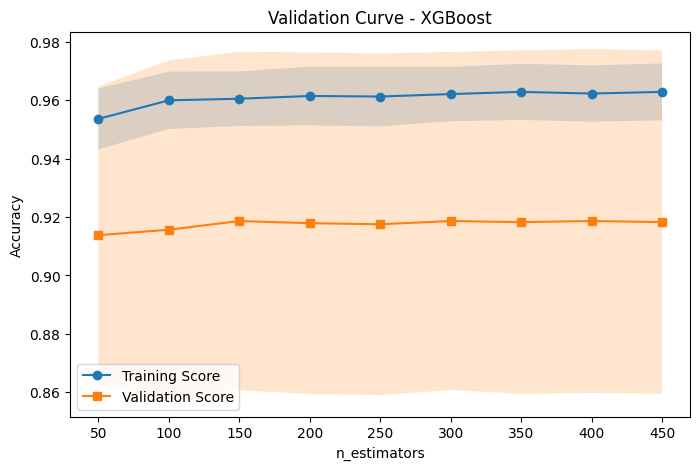


Plotting Validation Curve for LightGBM
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 1071, number of negative: 1071
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4385
[LightGBM] [Info] Number of data points in the train set: 2142, number of used features: 27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain:

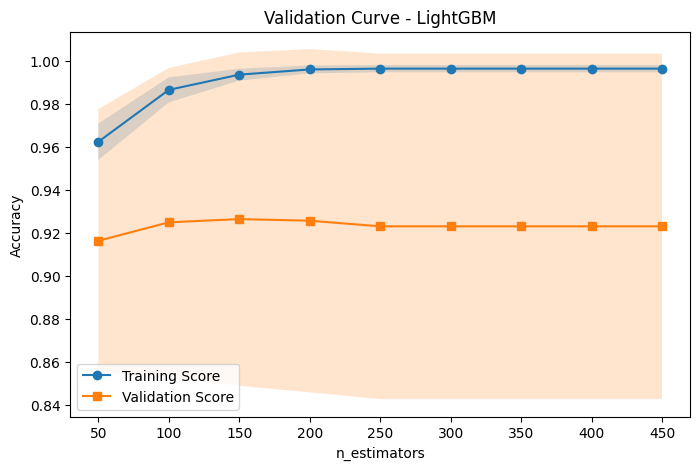


Plotting Validation Curve for CatBoost


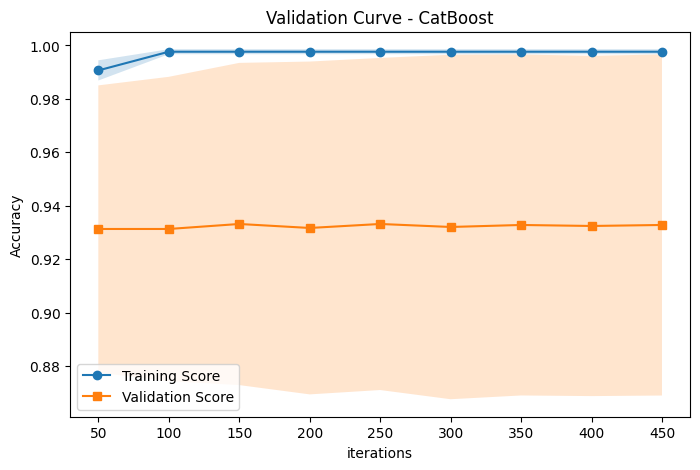

Skipping Validation Curves for Stacking Model (Not applicable)


In [120]:
for model_name, model in models.items():
    if model_name == "Stacking Model":
        print(f"Skipping Validation Curves for {model_name} (Not applicable)")
        continue  # Skip StackingClassifier since it cannot be tuned like base models
    
    print(f"\nPlotting Validation Curve for {model_name}")
    plot_validation_curve(model, X_train_resampled, y_train_resampled, model_name)
